# Import modules

In [1]:
import os
import glob
import shutil
from tqdm import tqdm
from random import shuffle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
from osgeo import gdal

import random
import albumentations as A
from sklearn.model_selection import *

from catboost import CatBoostClassifier

from sklearn.metrics import jaccard_score
from sklearn.model_selection import StratifiedKFold

import rasterio

import warnings
warnings.filterwarnings('ignore')

# Load data

In [2]:
meta = pd.read_csv('STAC_Overflow_Map_Floodwater_from_Radar_Imagery_-_Training_metadata.csv')
meta = meta.drop_duplicates('chip_id').reset_index(drop=True)

In [3]:
location_chips = meta.groupby('location').chip_id.unique()
print('Number of countries:', location_chips.shape[0])
print('Number of images in the train:', meta.chip_id.nunique())

Number of countries: 13
Number of images in the train: 542


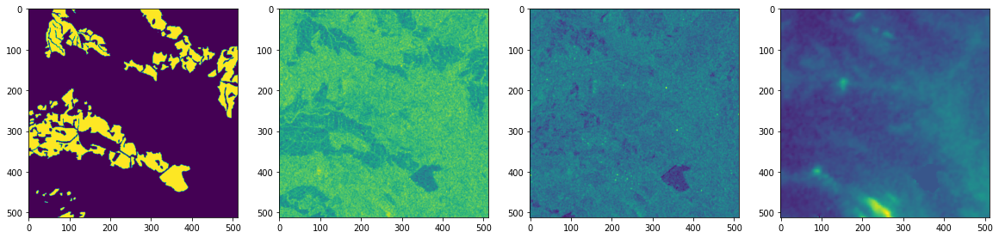

In [4]:
filenames = [x.split('.')[0] for x in os.listdir('train_labels/')]

for fn in filenames[17:18]:
    
    with rasterio.open('train_features/{}_vv.tif'.format(fn)) as fvv:
        vv = fvv.read(1)
    with rasterio.open('train_features/{}_vh.tif'.format(fn)) as fvh:
        vh = fvh.read(1)
    with rasterio.open('train_features/{}_nasadem.tif'.format(fn)) as nasadem_:
        nasadem = nasadem_.read(1)
    with rasterio.open('train_labels/{}.tif'.format(fn)) as fmask:
        mask = fmask.read(1)
        
    _, ax = plt.subplots(1, 4, figsize=(20, 6))
    ax[0].imshow(mask)
    ax[1].imshow(vh)
    ax[2].imshow(vv)
    ax[3].imshow(nasadem)
    plt.show()

# Data process functions

The value 255 means empty zones in the photo. I convert them to zeros.

In [5]:
def process_mask(mask):
    mask_temp = mask.copy()
    mask_temp[mask == 255] = 0
    return mask_temp

Resizing augmentations help reduce the dimensionality of the data. But best models were made without dimension reduction.

In [6]:
# def augment_image(image, mask):

#     aug = A.Compose([
        
#         A.OneOf([
#             A.Resize(512, 512, p=0.35),
#             A.Resize(256, 256, p=0.45),
#             A.Resize(128, 128, p=0.55),
#             A.Resize(64, 64, p=0.65)
#         ], p=1)
    
#     ])

#     augmented = aug(image=image, mask=mask)

#     return augmented['image'], augmented['mask']

Function that translates one image into a table.

In [7]:
def get_one(path):
    
    with rasterio.open('train_features/{}_vv.tif'.format(path)) as fvv:
        vv = fvv.read(1)
    with rasterio.open('train_features/{}_vh.tif'.format(path)) as fvh:
        vh = fvh.read(1)
    
    with rasterio.open('train_features/{}_nasadem.tif'.format(path)) as nasadem_:
        nasadem = nasadem_.read(1)
    with rasterio.open('train_features/{}_jrc-gsw-change.tif'.format(path)) as jrc_gsw_change_:
        jrc_gsw_change = jrc_gsw_change_.read(1)
    with rasterio.open('train_features/{}_jrc-gsw-extent.tif'.format(path)) as jrc_gsw_extent_:
        jrc_gsw_extent = jrc_gsw_extent_.read(1)
    with rasterio.open('train_features/{}_jrc-gsw-occurrence.tif'.format(path)) as jrc_gsw_occurrence_:
        jrc_gsw_occurrence = jrc_gsw_occurrence_.read(1)
    with rasterio.open('train_features/{}_jrc-gsw-recurrence.tif'.format(path)) as jrc_gsw_recurrence_:
        jrc_gsw_recurrence = jrc_gsw_recurrence_.read(1)
    with rasterio.open('train_features/{}_jrc-gsw-seasonality.tif'.format(path)) as jrc_gsw_seasonality_:
        jrc_gsw_seasonality = jrc_gsw_seasonality_.read(1)
    with rasterio.open('train_features/{}_jrc-gsw-transitions.tif'.format(path)) as jrc_gsw_transitions_:
        jrc_gsw_transitions = jrc_gsw_transitions_.read(1)
    
    with rasterio.open('train_labels/{}.tif'.format(path)) as fmask:
        mask = process_mask(fmask.read(1))
                            
    temp = pd.DataFrame()

    temp['vh'] = vv.flatten()
    temp['vv'] = vh.flatten()
    temp['nasadem'] = nasadem.flatten()
    temp['jrc_gsw_change'] = jrc_gsw_change.flatten()
    temp['jrc_gsw_occurrence'] = jrc_gsw_occurrence.flatten()
    temp['jrc_gsw_extent'] = jrc_gsw_extent.flatten()
    temp['jrc_gsw_recurrence'] = jrc_gsw_recurrence.flatten()
    temp['jrc_gsw_seasonality'] = jrc_gsw_seasonality.flatten()
    temp['jrc_gsw_transitions'] = jrc_gsw_transitions.flatten()
    
    temp['y'] = mask.flatten()
    
    return temp

Function that concatenates tables for a single image into one big table.

In [8]:
def get_data(chips, augment=True):
    data = pd.DataFrame()
    for path in tqdm(chips):
        data = pd.concat([data, get_one(path)], ignore_index=True)
    return data

# CatBoostClassifier sample

In [21]:
train = get_data(filenames[:50])

100%|███████████████████████████████████████████| 50/50 [00:04<00:00, 10.84it/s]


In [23]:
print('Train shape:', train.shape)

Train shape: (13107200, 10)


In [24]:
train.head()

,vh,vv,nasadem,jrc_gsw_change,jrc_gsw_occurrence,jrc_gsw_extent,jrc_gsw_recurrence,jrc_gsw_seasonality,jrc_gsw_transitions,y
0,-8.402873,-11.147009,221,253,0,0,0,0,0,0
1,-9.328785,-14.086936,221,253,0,0,0,0,0,0
2,-10.022814,-18.411779,221,253,0,0,0,0,0,0
3,-8.974891,-18.257769,221,253,0,0,0,0,0,0
4,-7.946253,-16.056496,221,253,0,0,0,0,0,0


In [22]:
X_train, X_val, y_train, y_val = train_test_split(train.drop(['y'], axis=1), train['y'],
                                                  test_size=0.15, stratify=train['y'])

In [25]:
model = CatBoostClassifier(iterations=1000, verbose=100, early_stopping_rounds=100)
model.fit(X_train, y_train, eval_set=(X_val, y_val))

Learning rate set to 0.316592
0:	learn: 0.2212149	test: 0.2212009	best: 0.2212009 (0)	total: 1.11s	remaining: 18m 32s
100:	learn: 0.0593656	test: 0.0592917	best: 0.0592917 (100)	total: 1m 2s	remaining: 9m 16s
200:	learn: 0.0577820	test: 0.0577998	best: 0.0577998 (196)	total: 2m 4s	remaining: 8m 14s
300:	learn: 0.0576730	test: 0.0577053	best: 0.0577053 (300)	total: 2m 53s	remaining: 6m 42s
400:	learn: 0.0576663	test: 0.0576987	best: 0.0576987 (315)	total: 3m 43s	remaining: 5m 34s
Stopped by overfitting detector  (100 iterations wait)

bestTest = 0.0576987069
bestIteration = 315

Shrink model to first 316 iterations.


In [28]:
jaccard_score(y_val, model.predict(X_val))

0.9057157547979816

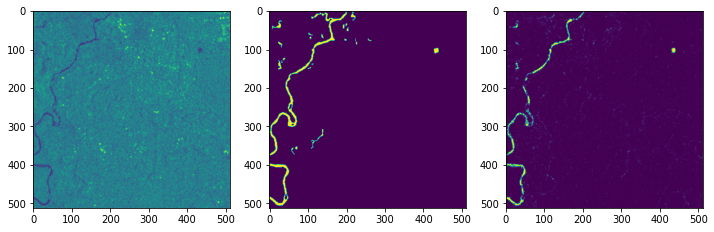

In [42]:
test_one = get_one(filenames[60])
_, ax = plt.subplots(1, 3, figsize=(12, 4))
ax[0].imshow(np.array(test_one['vh']).reshape((512, 512)))
ax[1].imshow(np.array(test_one['y']).reshape((512, 512)), vmin=0, vmax=1)
ax[2].imshow(model.predict_proba(test_one)[:, -1].reshape((512, 512)), vmin=0, vmax=1)
plt.show()

In [43]:
fip = pd.DataFrame()
fip['col'] = X_train.columns
fip['val'] = model.get_feature_importance()
fip = fip.sort_values('val', ascending=False)
fip

,col,val
2,nasadem,57.810950
1,vv,15.312915
0,vh,9.367961
4,jrc_gsw_occurrence,8.752791
8,jrc_gsw_transitions,3.079562
3,jrc_gsw_change,2.828459
6,jrc_gsw_recurrence,1.591240
7,jrc_gsw_seasonality,1.225158
5,jrc_gsw_extent,0.030964


**Tentative conclusion:**

> If you look for works on mathematical methods for determining flooding, you can see formulas that allow you to find flooding pixel by pixel. This suggests the idea of using pixel-by-pixel prediction by gradient boosting.

> This method works. Maybe even not bad)

> Nasadem is very important feature. And this is not surprising, because if you think about the physical sense, the lower the elevation, the higher the chance of flooding.

# Stratified models

Unfortunately, I didn't have much computing power, so I took a test (smaller) part from the StratifiedKFold. And then divided it into training and validation samples.

Stratification was performed based on location. EDA shows that the degree of flooding correlates with the location.

## EDA of flooding

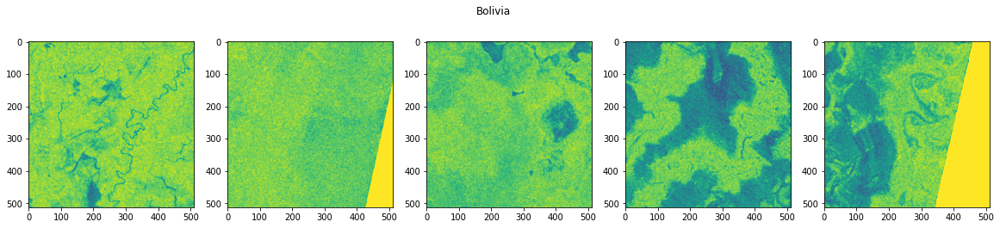

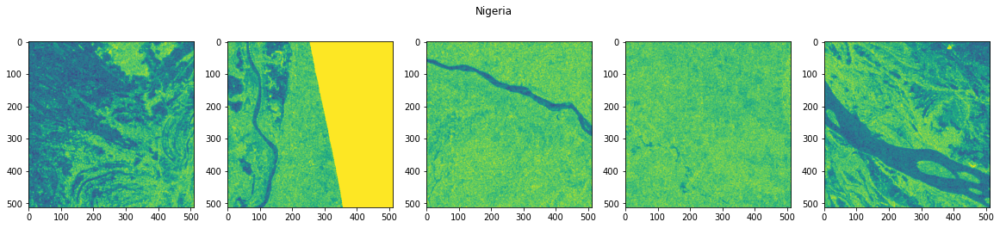

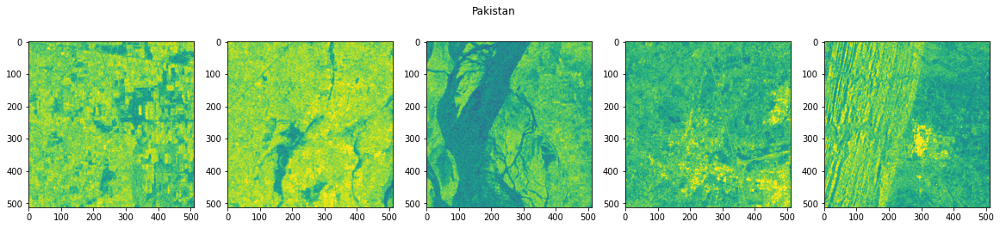

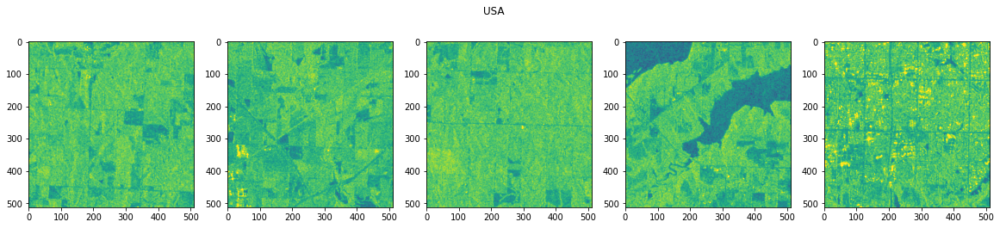

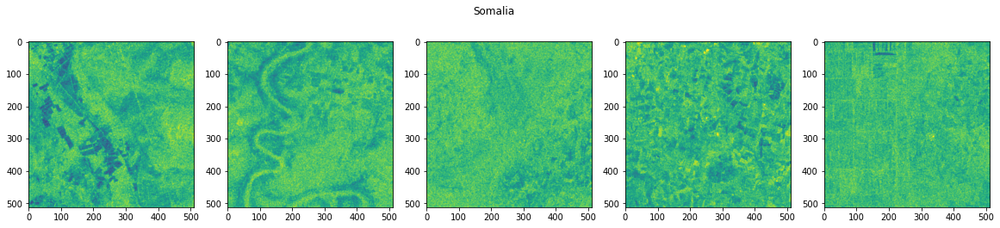

...

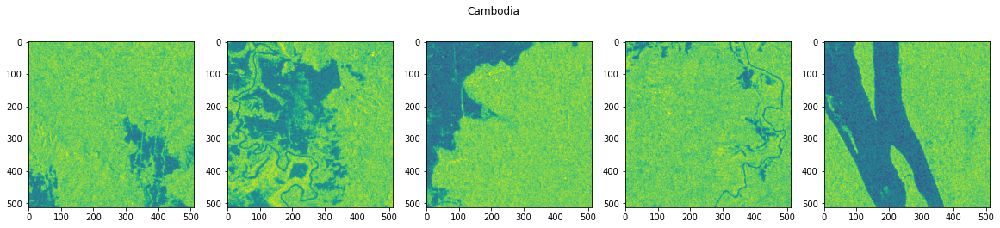

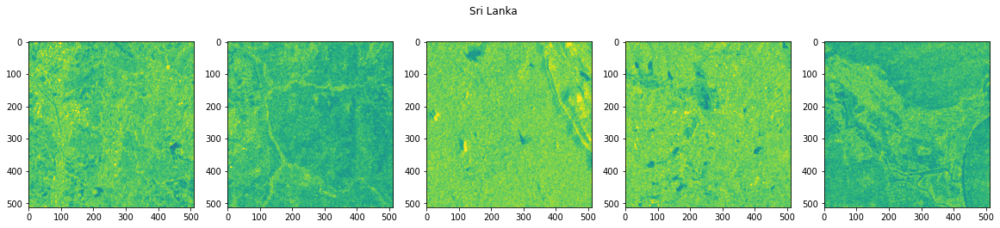

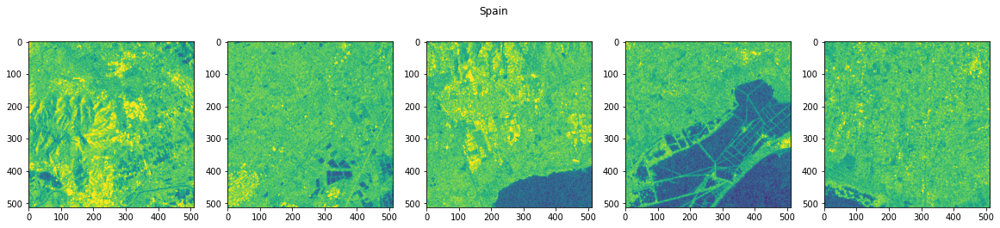

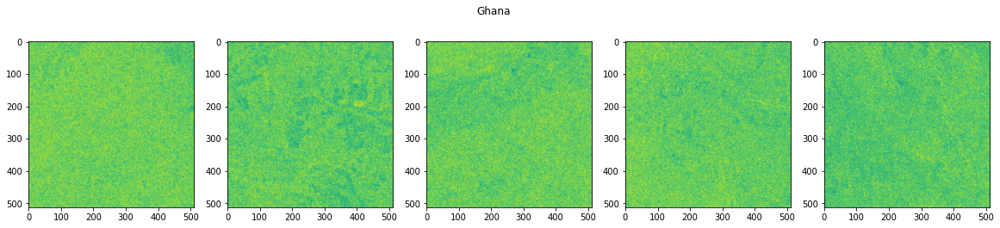

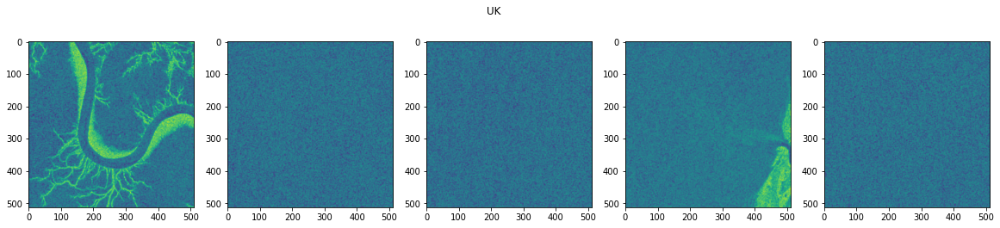

In [53]:
for loc in meta.location.unique():
    
    paths = meta[meta.location == loc].sample(5).chip_id.iloc[:]
    
    _, ax = plt.subplots(1, 5, figsize=(20, 4))
    
    for i, path in enumerate(paths):
        
        with rasterio.open('train_features/{}_vv.tif'.format(path)) as fvv:
            vv = fvv.read(1)
        
        ax[i].imshow(vv, vmin=-37, vmax=0)
    
    plt.suptitle(loc)

In [55]:
all_masks = []
locate = []
floodly = []
pathly = []

for loc in tqdm(meta.location.unique()):
    
    paths = meta[meta.location == loc].chip_id.values
    
    for i, path in enumerate(paths):

        mask = process_mask(gdal.Open('train_labels/{}.tif'.format(path)).ReadAsArray())
        
        all_masks.append(mask)
        locate.append(loc)
        floodly.append(mask.sum() / (512*512))
        pathly.append(path)
        
flood_eda = pd.DataFrame()
flood_eda['path'] = pathly
flood_eda['location'] = locate
flood_eda['floodly'] = floodly

100%|███████████████████████████████████████████| 13/13 [00:00<00:00, 57.68it/s]


In [56]:
flood_eda.groupby('location').floodly.describe().sort_values('mean')

,count,mean,std,min,25%,50%,75%,max
location,,,,,,,,
Slovakia,65.0,0.018061,0.045572,0.000000,0.000000,0.002762,0.009850,0.309711
USA,69.0,0.045430,0.067134,0.000629,0.007526,0.013943,0.065514,0.324692
Somalia,26.0,0.051354,0.063737,0.000000,0.000000,0.022242,0.105273,0.224854
Ghana,53.0,0.062545,0.156755,0.000000,0.000000,0.002308,0.023003,0.760483
Pakistan,28.0,0.080402,0.121815,0.000000,0.000318,0.022778,0.087570,0.397087
Paraguay,66.0,0.120797,0.164953,0.000000,0.003574,0.039627,0.185753,0.643555
Sri Lanka,42.0,0.123861,0.213094,0.000000,0.010920,0.058449,0.159247,0.981300
Spain,30.0,0.137300,0.190589,0.000904,0.012286,0.052517,0.233992,0.809994
India,68.0,0.142401,0.157759,0.000000,0.020671,0.079449,0.197027,0.648365


## Sequential sampling

In [ ]:
k = 0

for i in range(0, 542, 68):
    
    fns = filenames[i:i+68]

    train = get_data(fns)

    X_train, X_val, y_train, y_val = train_test_split(train.drop(['y'], axis=1), train['y'],
                                                      test_size=0.15, stratify=train['y'])

    model = CatBoostClassifier(iterations=1000, early_stopping_rounds=200)
    model.fit(X_train, y_train, eval_set=(X_val, y_val), verbose=250)

    model.save_model('sequential_models/model{}'.format(k))
    k += 1

    print('\nJaccard on local val:', jaccard_score(y_val, model.predict(X_val)))
    print('\n')

## KFold

In [ ]:
i = 0

for train_index, test_index in KFold(n_splits=4).split(meta):
    
    train = get_data(list(meta.chip_id.iloc[test_index].values))
    
    X_train, X_val, y_train, y_val = train_test_split(train.drop(['y'], axis=1), train['y'],
                                                      test_size=0.15, stratify=train['y'])

    model = CatBoostClassifier(iterations=1000, early_stopping_rounds=200)
    model.fit(X_train, y_train, eval_set=(X_val, y_val), verbose=250)
    
    model.save_model('kfold_models/kfold{}'.format(i))
    i += 1
    
    print('\nJaccard on local val:', jaccard_score(y_val, model.predict(X_val)))
    print('\n')

## StratifiedKFold

In [ ]:
i = 0

for train_index, test_index in StratifiedKFold(n_splits=4).split(meta, meta.location):
    
    train = get_data(list(meta.chip_id.iloc[test_index].values))
    
    X_train, X_val, y_train, y_val = train_test_split(train.drop(['y'], axis=1), train['y'],
                                                      test_size=0.15, stratify=train['y'])

    model = CatBoostClassifier(iterations=1000, early_stopping_rounds=200)
    model.fit(X_train, y_train, eval_set=(X_val, y_val), verbose=250)
    
    model.save_model('skfold_models/stratifiedkfold{}'.format(i))
    i += 1
    
    print('\nJaccard on local val:', jaccard_score(y_val, model.predict(X_val)))
    print('\n')

## Stratify by region

In [57]:
regions = [
           ['Bolivia', 'Paraguay'],
           ['Nigeria', 'Somalia', 'Ghana'],
           ['Pakistan', 'India', 'Cambodia', 'Sri Lanka'],
           ['USA', 'Slovakia', 'Spain', 'UK']
]

In [61]:
i = 0

for region in regions:
    
    train = get_data(list(meta[meta.location.isin(region)].chip_id.values))
    
    X_train, X_val, y_train, y_val = train_test_split(train.drop(['y'], axis=1), train['y'],
                                                      test_size=0.15, stratify=train['y'])

    model = CatBoostClassifier(iterations=1000, early_stopping_rounds=200)
    model.fit(X_train, y_train, eval_set=(X_val, y_val), verbose=250)
    
    model.save_model('region_models/region{}'.format(i))
    i += 1
    
    print('\nJaccard on local val:', jaccard_score(y_val, model.predict(X_val)))
    print('\n')

# Testing of all models


In [10]:
models_seq = []
for i in range(8):
    model = CatBoostClassifier()
    model.load_model('models/sequential_models/model{}'.format(i))
    models_seq.append(model)

models_kfold = []
for i in range(4):
    model = CatBoostClassifier()
    model.load_model('models/kfold_models/kfold{}'.format(i))
    models_kfold.append(model)
    
models_skfold = []
for i in range(4):
    model = CatBoostClassifier()
    model.load_model('models/skfold_models/stratifiedkfold{}'.format(i))
    models_skfold.append(model)
    
models_region = []
for i in range(4):
    model = CatBoostClassifier()
    model.load_model('models/region_models/region{}'.format(i))
    models_region.append(model)

In [91]:
val = get_data(meta.sample(20).chip_id.values)

val_preds = np.zeros((val.shape[0], 20))

i = 0

for models in [models_seq, models_kfold, models_skfold, models_region]:
    for model in models:
        val_preds[:, i] = model.predict_proba(val.drop(['y'], axis=1))[:, 1]
        i+=1
        
val_preds_agg = np.mean(val_preds, axis=1)
val_preds_binary = val_preds_agg.copy()
val_preds_binary[val_preds_binary > 0.5] = 1
val_preds_binary[val_preds_binary <= 0.5] = 0
val_preds_binary = val_preds_binary.astype(int)

print('Jaccard on this sample:', jaccard_score(val['y'], val_preds_binary))

100%|███████████████████████████████████████████| 20/20 [00:01<00:00, 14.40it/s]


Jaccard on this sample: 0.5732907268511912


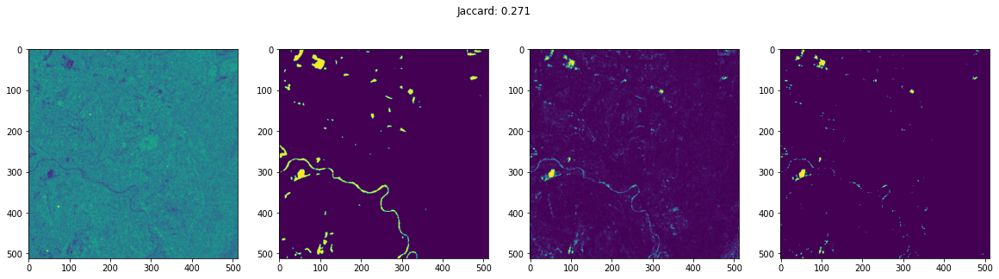

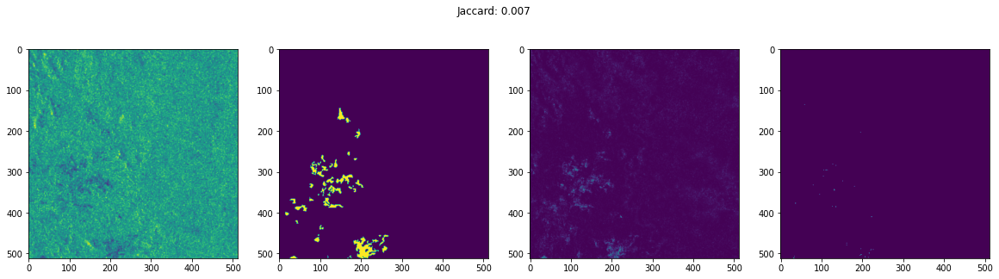

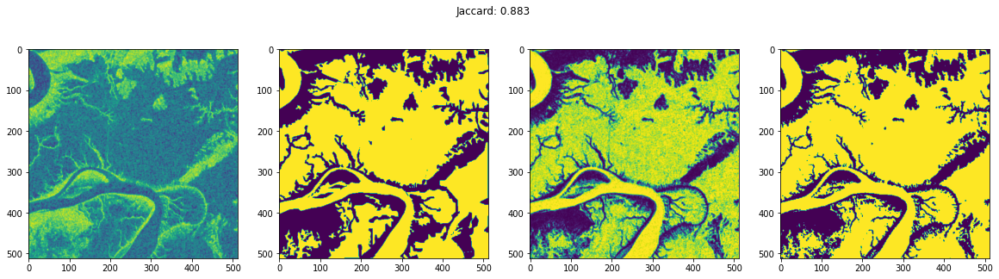

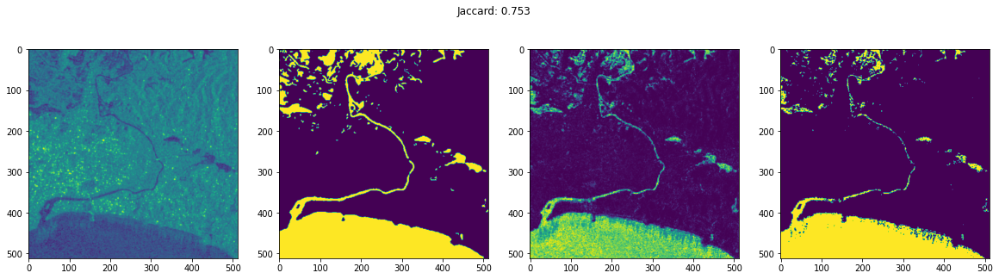

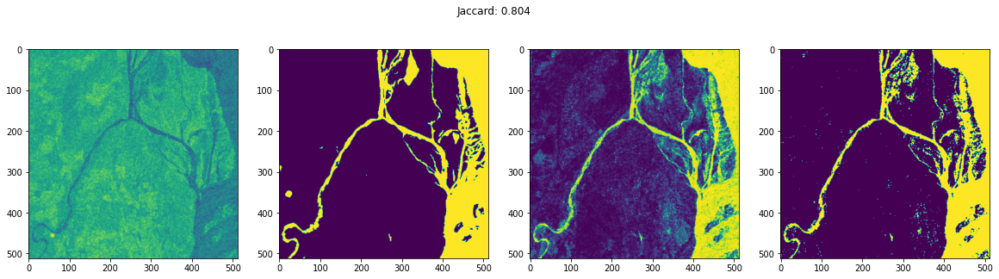

...

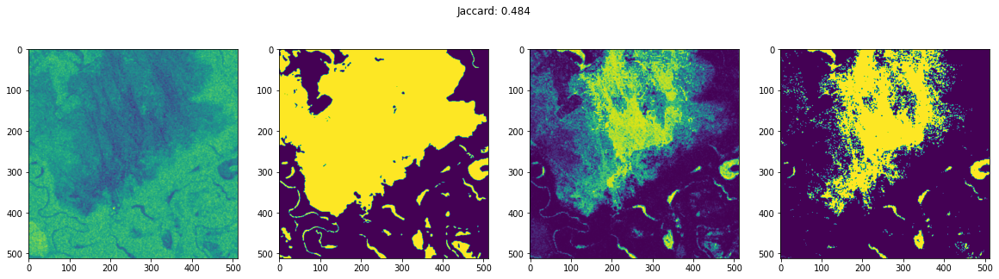

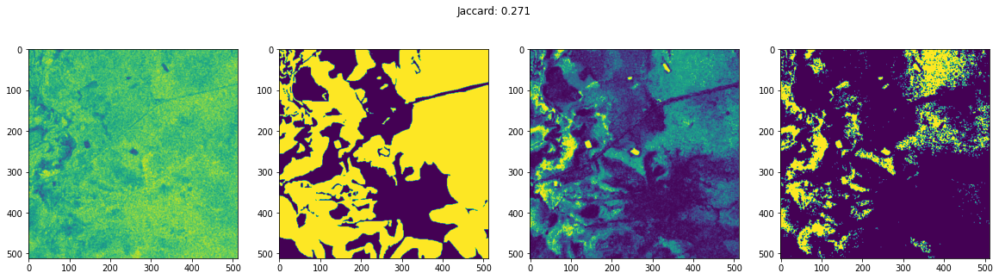

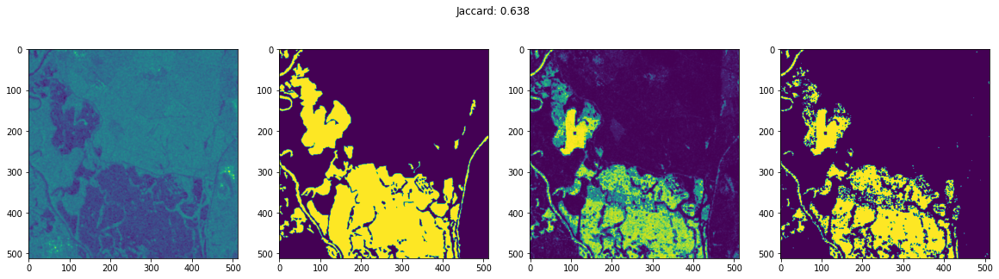

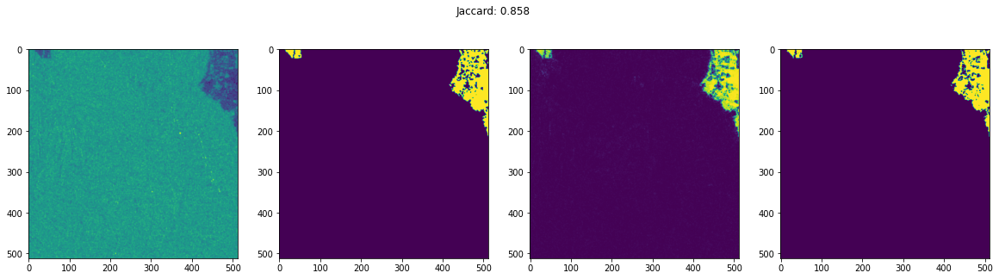

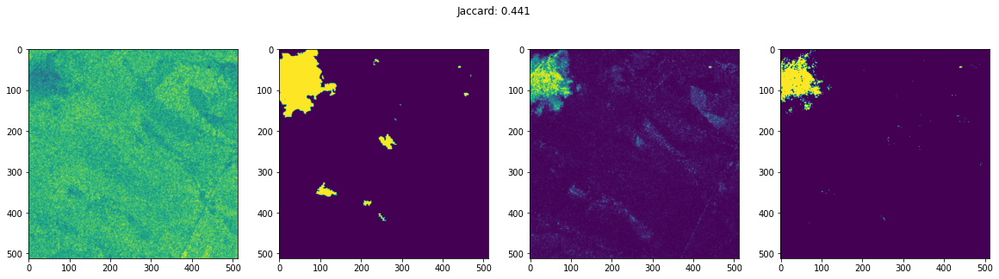

In [93]:
for i in range(20):

    i_low = i * 512*512
    i_up = i_low + 512*512
    
    _, ax = plt.subplots(1, 4, figsize=(20, 5))
    ax[0].imshow(np.array(val['vh'].iloc[i_low:i_up]).reshape((512, 512)))
    ax[1].imshow(np.array(val['y'].iloc[i_low:i_up]).reshape((512, 512)), vmin=0, vmax=1)
    ax[2].imshow(val_preds_agg[i_low:i_up].reshape((512, 512)), vmin=0, vmax=1)
    ax[3].imshow(val_preds_binary[i_low:i_up].reshape((512, 512)), vmin=0, vmax=1)
    plt.suptitle('Jaccard: ' + str(round(jaccard_score(np.array(val['y'].iloc[i_low:i_up]), 
                                                       val_preds_binary[i_low:i_up]), 3)))
    plt.show()

In [13]:
intersection = 0
union = 0
ious = []

for f in tqdm(filenames):
    
    temp = get_one(f)
    
    pred_cat = np.zeros((temp.shape[0], 20))
    
    i = 0
    for models in [models_seq, models_kfold, models_skfold, models_region]:
        for model in models:
            pred_cat[:, i] = model.predict_proba(temp)[:, 1]
            i += 1
            
    pred_cat = np.mean(pred_cat, axis=1).reshape(512, 512)
    pred_cat[pred_cat < 0.5] = 0
    pred_cat[pred_cat >= 0.5] = 1
    
    mask = np.array(temp['y']).reshape((512, 512))

    intersection += np.logical_and(mask, pred_cat).sum()
    union += np.logical_or(mask, pred_cat).sum()
    
    ious.append(intersection / union)

iou = intersection / union

100%|█████████████████████████████████████████| 542/542 [09:30<00:00,  1.05s/it]


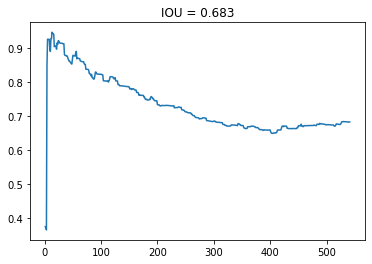

In [14]:
plt.plot(ious)
plt.title('IOU = ' + str(round(iou, 3)))
plt.show()

# Save some predictions to compare and combine them with CatBoost predictions

In [16]:
compare_df = pd.read_csv('compare_df.csv')

compare_paths = []

for f in tqdm(compare_df.files.values):
    
    temp = get_one(f)
    
    pred_cat = np.zeros((temp.shape[0], 20))
    
    i = 0
    for models in [models_seq, models_kfold, models_skfold, models_region]:
        for model in models:
            pred_cat[:, i] = model.predict_proba(temp)[:, 1]
            i += 1
            
    pred_cat = np.mean(pred_cat, axis=1).reshape(512, 512)
    pred_cat[pred_cat < 0.5] = 0
    pred_cat[pred_cat >= 0.5] = 1
    
    compare_paths.append('result_for_compare/cat_'+f)
    np.save('result_for_compare/cat_'+f, pred_cat)
    
compare_df['cat_path'] = compare_paths
compare_df.to_csv('compare_df.csv', index=False)

100%|███████████████████████████████████████████| 20/20 [00:21<00:00,  1.06s/it]
